<a href="https://colab.research.google.com/github/wilmi94/MasterThesis-AE-Codes/blob/main/CME_binaryclassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Simple binary classification of CMEs 
* based on Liu et al. 2020 cme event list
* how much accuracy can be achieved?

## Setup Project

In [ ]:
%%capture 
pip install sunpy

In [ ]:
%%capture 
pip install zeep

In [ ]:
%%capture 
pip install drms

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
from sunpy.net import Fido, attrs as a
import matplotlib.pyplot as plt
import tensorflow as tf
from astropy.io import fits
from astropy.time import Time
import sunpy.map
import drms
import numpy as np
import pandas as pd
import cv2
import os   

In [ ]:
# Setup working directory in Google Drive. 
#This way, if your notebook times out, files will be saved in Google Drive!

# the base Google Drive directory
root_dir = "/content/drive/My Drive/"

# choose where you want your project files to be saved
project_folder = "Academia/MSc. Aerospace Engineering - FH Wiener Neustadt/4. Master Thesis/05-notebooks/CME_binary_classification/basedata"
path = root_dir + project_folder
def create_and_set_working_directory(folder):
  # check if your project folder exists. if not, it will be created.
  if os.path.isdir(path + folder) == False:
    os.mkdir(root_dir + project_folder)
    print(root_dir + project_folder + ' did not exist but was created.')

  # change the OS to use your project folder as the working directory
  os.chdir(root_dir + project_folder)

  print('\nYour working directory was changed to ' + root_dir + project_folder) #+ \
        #"\nAn empty text file was created there. You can also run !pwd to confirm the current working directory." )

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#C:\Users\Wilmar\My Drive\Academia\MSc. Aerospace Engineering - FH Wiener Neustadt\4. Master Thesis\05-notebooks\download_images
%cd /content/drive/My\ Drive/Academia/MSc. Aerospace Engineering - FH Wiener Neustadt/4. Master Thesis/05-notebooks/CME_binary_classification/basedata

# List files to make sure we're in the expected directory.
!ls

/content/drive/My Drive/Academia/MSc. Aerospace Engineering - FH Wiener Neustadt/4. Master Thesis/05-notebooks/CME_binary_classification/basedata
 all_cme_events.csv	  downloads		      testing
 cme_events.csv		  no_cme_events.csv	      training
 cmes_downloads		  no_cmes_downloads	      validation
'cmes_downloads - Copy'  'no_cmes_downloads - Copy'


# Get Data

## load event list

In [ ]:
df_cme_eventlist = pd.read_csv(r'cme_events.csv', sep = ';')
df_cme_eventlist

,Flare Class,Start Time,Peak Time,End Time,Active Region Number,Harp Number,CME
0,X2.2,2011-02-15T01:44Z,2011-02-15T01:56Z,2011-02-15T02:06Z,11158,377,2011-02-15T02:25:00-CME-001
1,M3.5,2011-02-24T07:23Z,2011-02-24T07:35Z,2011-02-24T07:42Z,11163,392,2011-02-24T08:00:00-CME-001
2,M3.7,2011-03-07T19:43Z,2011-03-07T20:12Z,2011-03-07T20:58Z,11164,393,2011-03-07T20:12:00-CME-001
3,M2.0,2011-03-07T13:45Z,2011-03-07T14:30Z,2011-03-07T14:56Z,11166,401,2011-03-07T14:40:00-CME-001
4,M1.5,2011-03-08T03:37Z,2011-03-08T03:58Z,2011-03-08T04:20Z,11171,415,2011-03-08T05:00:00-CME-001
...,...,...,...,...,...,...,...
124,M3.9,2017-09-07T23:50Z,2017-09-07T23:59Z,2017-09-08T00:14Z,12673,7115,2017-09-07T23:36:00-CME-001
125,M1.5,2017-09-04T15:11Z,2017-09-04T15:30Z,2017-09-04T15:33Z,12673,7115,2017-09-04T19:39:00-CME-001
126,M1.2,2017-09-08T03:39Z,2017-09-08T03:43Z,2017-09-08T03:45Z,12673,7115,2017-09-08T04:17:00-CME-001
127,M1.0,2017-09-04T18:05Z,2017-09-04T18:22Z,2017-09-04T18:31Z,12673,7115,2017-09-04T19:39:00-CME-001


In [ ]:
df_no_cme_eventlist = pd.read_csv(r'no_cme_events.csv', sep = ';')
df_no_cme_eventlist

,Flare Class,Start Time,Peak Time,End Time,Active Region Number,Harp Number,CME
0,M1.2,2010-05-05T17:13Z,2010-05-05T17:19Z,2010-05-05T17:22Z,11069,8,No
1,M1.0,2010-06-13T05:30Z,2010-06-13T05:39Z,2010-06-13T05:44Z,11079,49,No
2,M2.0,2010-06-12T00:30Z,2010-06-12T00:57Z,2010-06-12T01:02Z,11081,54,No
3,M1.0,2010-08-07T17:55Z,2010-08-07T18:24Z,2010-08-07T18:47Z,11093,115,No
4,M2.9,2010-10-16T19:07Z,2010-10-16T19:12Z,2010-10-16T19:15Z,11112,211,No
...,...,...,...,...,...,...,...
605,M1.3,2017-09-08T02:19Z,2017-09-08T02:24Z,2017-09-08T02:29Z,12673,7115,No
606,M1.2,2017-09-04T05:36Z,2017-09-04T05:49Z,2017-09-04T06:05Z,12673,7115,No
607,M1.1,2017-09-09T04:14Z,2017-09-09T04:28Z,2017-09-09T04:43Z,12673,7115,No
608,M1.1,2017-09-09T22:04Z,2017-09-09T23:53Z,2017-09-10T00:41Z,12673,7115,No


## download images - example code
code from **plot_swx_d3** notebook

Query the image data and header metadata using drms, then download and open the unmerged FITS file with astropy:

In [ ]:
c = drms.Client()

In [ ]:
hmi_query_string = 'hmi.sharp_cea_720s[377][2011.02.15_02:12:00_TAI]'
keys, segments = c.query(hmi_query_string, key='T_REC, USFLUX, ERRVF', seg='Br')
url = 'http://jsoc.stanford.edu' + segments.Br[0]   # add the jsoc.stanford.edu suffix to the segment name
photosphere_image = fits.open(url)    

The dimensions of this image are 377 by 744 .


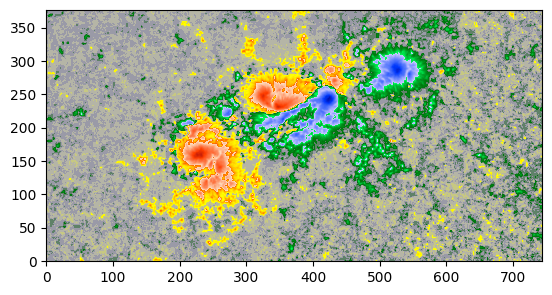

In [ ]:
hmimag = plt.get_cmap('hmimag')
plt.imshow(photosphere_image[1].data,cmap=hmimag,origin='lower',vmin=-3000,vmax=3000)
print('The dimensions of this image are',photosphere_image[1].data.shape[0],'by',photosphere_image[1].data.shape[1],'.')

We can easily export any image data as a jpg using one of several color tables (see the expordata website under the jpg protocol for a list of color tables). Here is an example with NOAA Active Region 11158 at the time of the X2.2-class flare.

In [ ]:
protocol_args = {'ct': 'HMI_mag.lut', 'min': -3000, 'max': 3000}

In [ ]:
r = c.export('hmi.sharp_cea_720s[377][2011.02.14_02:00:00]{Br}', protocol='jpg', protocol_args=protocol_args, email='ender.wilmar')

NameError: ignored

## download images from JSOC database

In [ ]:
out_dir = 'downloads'
if not os.path.exists(out_dir):
    os.mkdir(out_dir)


client = drms.Client(email= 'ender.wilmar@gmail.com', verbose=False)  
si = client.info('hmi.sharp_cea_720s')
#print(si.segments.index.values) 

In [ ]:
def download_jsoc_imagedata(eventlist, out_dir):
  '''
  downloads and save FITS (hmi.sharp_cea_720s) files from JSOC 
  input:
    eventlist : datafram
  
  output:
    FITS files in defined download folder

  '''
  fits_data = []

  for index, row in eventlist.iterrows():
    t = row['Peak Time']
    harp_number = row ['Harp Number']
    peak_time = Time(t, format='isot', scale='utc').tai
    hmi = 'hmi.sharp_cea_720s[' + str(harp_number) + '][' + str(peak_time) + ']'
    print('\n===== ' + str(index) + ' =====')
    print('query', hmi)
    keys, segments = client.query('hmi.sharp_cea_720s[8][2010-05-05T17:19:34.000]', 
                              key='T_REC, HARPNUM',
                              seg = 'magnetogram') 
    
    url = 'http://jsoc.stanford.edu' + segments.magnetogram[0] 
    data = fits.getdata(url)  
    ex = hmi + '{magnetogram}'
    export_request = client.export(ex, method='url', protocol='fits')  
    export_request.wait() 
    export_request.download(out_dir)  

In [ ]:
def save_image(map_data, out_dir):
  figure = plt.figure(frameon=False)
  ax = plt.axes([0, 0, 1, 1])
  # Disable the axis
  ax.set_axis_off()

  # Plot the map. Since are not interested in the exact map coordinates, we can
  # simply use :meth:`~matplotlib.Axes.imshow`.
  norm = map_data.plot_settings['norm']
  norm.vmin, norm.vmax = np.percentile(map_data.data, [1, 99.9])
  map_name = out_dir + '/' + str(map_data.name) +'.png'
  ax.imshow(map_data.data,
          norm=norm,
          cmap=map_data.plot_settings['cmap'],
          origin="lower")
  plt.savefig(map_name)

In [ ]:
download_jsoc_imagedata(df_cme_eventlist, out_dir)


===== 0 =====
query hmi.sharp_cea_720s[377][2011-02-15T01:56:34.000]

===== 1 =====
query hmi.sharp_cea_720s[392][2011-02-24T07:35:34.000]

===== 2 =====
query hmi.sharp_cea_720s[393][2011-03-07T20:12:34.000]

===== 3 =====
query hmi.sharp_cea_720s[401][2011-03-07T14:30:34.000]

===== 4 =====
query hmi.sharp_cea_720s[415][2011-03-08T03:58:34.000]

===== 5 =====
query hmi.sharp_cea_720s[637][2011-06-07T06:41:34.000]

===== 6 =====
query hmi.sharp_cea_720s[750][2011-08-04T03:57:34.000]

===== 7 =====
query hmi.sharp_cea_720s[750][2011-08-03T13:48:34.000]

===== 8 =====
query hmi.sharp_cea_720s[833][2011-09-07T22:38:34.000]

===== 9 =====
query hmi.sharp_cea_720s[892][2011-09-22T11:01:34.000]

===== 10 =====
query hmi.sharp_cea_720s[1321][2012-01-27T18:37:34.000]

===== 11 =====
query hmi.sharp_cea_720s[1321][2012-01-23T03:59:34.000]

===== 12 =====
query hmi.sharp_cea_720s[1449][2012-03-07T00:24:34.000]

===== 13 =====
query hmi.sharp_cea_720s[1449][2012-03-07T01:14:34.000]

===== 14 ==

downloads/hmi.sharp_cea_720s.377.20110215_020000_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.392.20110224_073600_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.393.20110307_201200_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.401.20110307_143600_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.415.20110308_040000_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.637.20110607_064800_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.750.20110804_040000_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.750.20110803_134800_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.833.20110907_223600_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.892.20110922_110000_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.1321.20120127_183600_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.1321.20120123_040000_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.1449.20120307_002400_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.1449.20120307_011200_TAI.magnetogram.fits
downloads/hmi.sh

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


downloads/hmi.sharp_cea_720s.1834.20120712_164800_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.1834.20120719_060000_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.1834.20120717_171200_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.2186.20121108_022400_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.2220.20121121_153600_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.2635.20130411_071200_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.2739.20130522_133600_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.2748.20130514_011200_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.2748.20130513_161200_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.2748.20130515_014800_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.3291.20131029_220000_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.3291.20131028_020000_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.3291.20131028_044800_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.3291.20131022_212400_TAI.magnetogram.fits
downlo

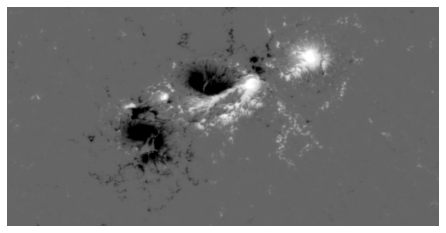

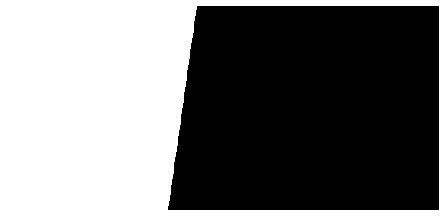

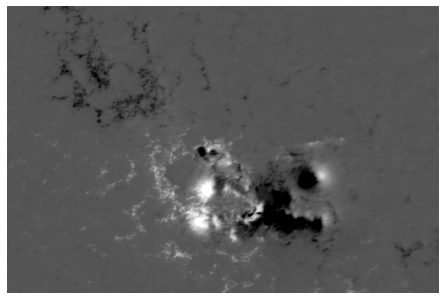

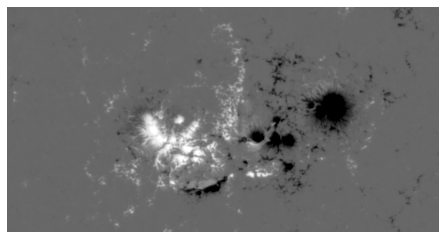

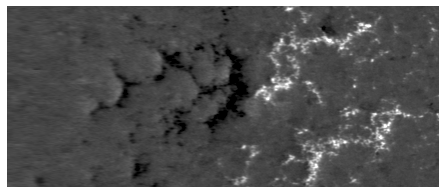

...

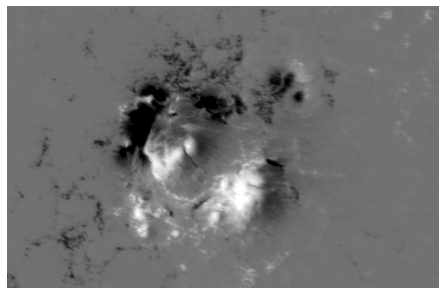

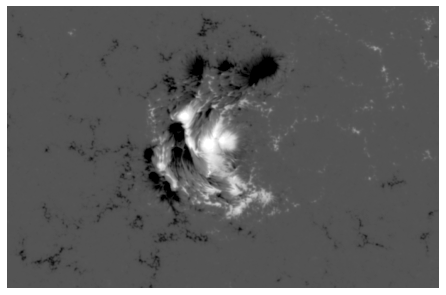

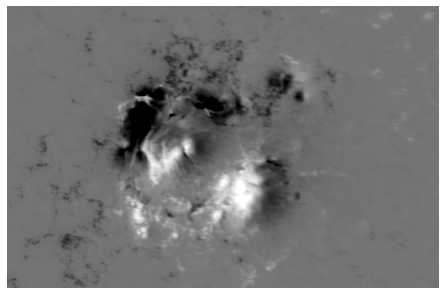

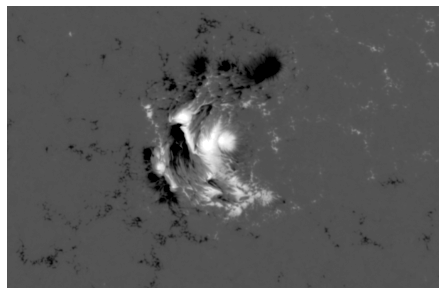

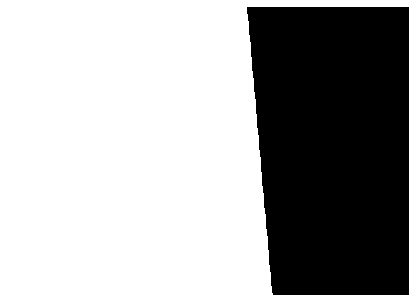

In [ ]:
for filename in os.listdir(out_dir):
    f = os.path.join(out_dir, filename)
    # checking if it is a file
    if os.path.isfile(f):
      print(f)
      map_mag = sunpy.map.Map(f)
      save_image(map_mag, out_dir)
      plt.close()

In [ ]:
download_jsoc_imagedata(df_no_cme_eventlist, out_dir)


===== 0 =====
query hmi.sharp_cea_720s[8][2010-05-05T17:19:34.000]

===== 1 =====
query hmi.sharp_cea_720s[49][2010-06-13T05:39:34.000]

===== 2 =====
query hmi.sharp_cea_720s[54][2010-06-12T00:57:34.000]

===== 3 =====
query hmi.sharp_cea_720s[115][2010-08-07T18:24:34.000]

===== 4 =====
query hmi.sharp_cea_720s[211][2010-10-16T19:12:34.000]

===== 5 =====
query hmi.sharp_cea_720s[245][2010-11-06T15:36:34.000]

===== 6 =====
query hmi.sharp_cea_720s[245][2010-11-04T23:58:34.000]

===== 7 =====
query hmi.sharp_cea_720s[245][2010-11-05T13:29:34.000]

===== 8 =====
query hmi.sharp_cea_720s[345][2011-01-28T01:03:34.000]

===== 9 =====
query hmi.sharp_cea_720s[362][2011-02-09T01:31:34.000]

===== 10 =====
query hmi.sharp_cea_720s[377][2011-02-13T17:38:34.000]

===== 11 =====
query hmi.sharp_cea_720s[377][2011-02-18T10:11:34.000]

===== 12 =====
query hmi.sharp_cea_720s[377][2011-02-14T17:26:34.000]

===== 13 =====
query hmi.sharp_cea_720s[377][2011-02-16T14:25:34.000]

===== 14 =====
quer

In [ ]:
for filename in os.listdir(out_dir):
    f = os.path.join(out_dir, filename)
    # checking if it is a file
    if os.path.isfile(f):
      print(f)
      map_mag = sunpy.map.Map(f)
      save_image(map_mag, out_dir)
      plt.close()

downloads/hmi.sharp_cea_720s.8.20100505_172400_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.49.20100613_053600_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.54.20100612_010000_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.115.20100807_182400_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.211.20101016_191200_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.245.20101106_153600_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.245.20101105_000000_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.245.20101105_133600_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.362.20110209_013600_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.377.20110213_173600_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.377.20110218_101200_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.377.20110214_172400_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.377.20110216_142400_TAI.magnetogram.fits
downloads/hmi.sharp_cea_720s.377.20110218_130000_TAI.magnetogram.fits
downloads/hmi.sharp_cea_

# Create Datasets

In [ ]:
!ls

 all_cme_events.csv  'cmes_downloads - Copy'   testing	  validation
 cme_events.csv       downloads		       training
 cmes_downloads       no_cme_events.csv        trash


In [ ]:
img = image.load_img('training/cme/HMI hmi 2011-02-15 01 58 12.png')


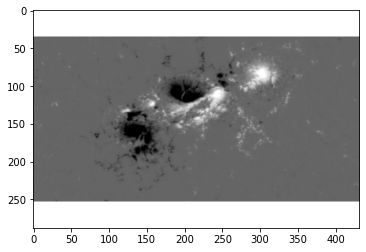

In [ ]:
plt.imshow(img)

In [ ]:
cv2.imread('training/cme/HMI hmi 2011-02-15 01 58 12.png').shape

(288, 432, 3)

In [ ]:
train = ImageDataGenerator(rescale=1/255)
validation =  ImageDataGenerator(rescale=1/255)

In [ ]:
train_dataset = train.flow_from_directory('training/',
                                          target_size = (200,200),
                                          batch_size = 10,
                                          class_mode = 'binary')

validation_dataset = train.flow_from_directory('testing/',
                                          target_size = (200,200),
                                          batch_size = 10,
                                          class_mode = 'binary')

Found 402 images belonging to 2 classes.
Found 169 images belonging to 2 classes.


In [ ]:
train_dataset.class_indices

{'cme': 0, 'no_cme': 1}

# Create Model

In [ ]:
model = tf.keras.models.Sequential([tf.keras.layers.Conv2D(16,(3,3), activation = 'relu', input_shape = (200,200,3)),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    #
                                    tf.keras.layers.Conv2D(32,(3,3), activation = 'relu', input_shape = (200,200,3)),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    #
                                    tf.keras.layers.Conv2D(64,(3,3), activation = 'relu', input_shape = (200,200,3)),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    #
                                    tf.keras.layers.Flatten(),
                                    #
                                    tf.keras.layers.Dense(512, activation = 'relu'),
                                    #
                                    tf.keras.layers.Dense(1, activation = 'sigmoid')                           
                                    ])

# Train & Test Model

In [ ]:
model.compile(loss = 'binary_crossentropy',
              optimizer = RMSprop(lr= 0.001),
              metrics = ['accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/rmsprop.py:135: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
model_fit = model.fit(train_dataset,
                      steps_per_epoch = 5,
                      epochs = 30,
                      validation_data = validation_dataset)

Epoch 1/30
5/5 [==============================] - 2s 337ms/step - loss: 2.3096 - accuracy: 0.5800 - val_loss: 0.4028 - val_accuracy: 0.8876
Epoch 2/30
5/5 [==============================] - 1s 279ms/step - loss: 0.5981 - accuracy: 0.7400 - val_loss: 0.5869 - val_accuracy: 0.8876
Epoch 3/30
5/5 [==============================] - 1s 275ms/step - loss: 0.5178 - accuracy: 0.8600 - val_loss: 0.3788 - val_accuracy: 0.8876
Epoch 4/30
5/5 [==============================] - 1s 277ms/step - loss: 0.5478 - accuracy: 0.8000 - val_loss: 0.4027 - val_accuracy: 0.8876
Epoch 5/30
5/5 [==============================] - 2s 476ms/step - loss: 0.4873 - accuracy: 0.7800 - val_loss: 0.4759 - val_accuracy: 0.8876
Epoch 6/30
5/5 [==============================] - 1s 277ms/step - loss: 0.7181 - accuracy: 0.7800 - val_loss: 0.3813 - val_accuracy: 0.8876
Epoch 7/30
5/5 [==============================] - 1s 277ms/step - loss: 0.5357 - accuracy: 0.8600 - val_loss: 0.4091 - val_accuracy: 0.8876
Epoch 8/30
5/5 [====

In [ ]:
!ls

 all_cme_events.csv	  no_cme_events.csv	      training
 cme_events.csv		  no_cmes_downloads	      validation
 cmes_downloads		 'no_cmes_downloads - Copy'
'cmes_downloads - Copy'   testing


testing/no_cme//HMI hmi 2014-10-24 21 46 14.png


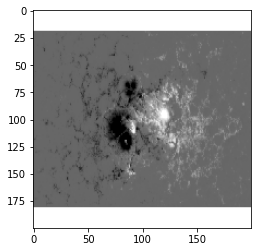

1/1 [==============================] - 0s 20ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-26 10 58 14.png


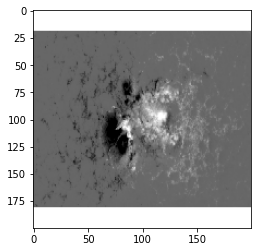

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-27 14 46 14.png


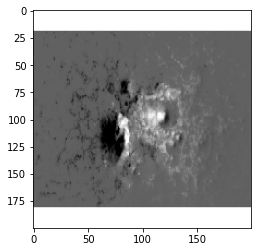

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-22 14 22 15.png


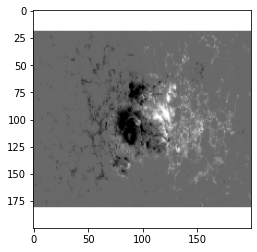

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-25 17 10 14.png


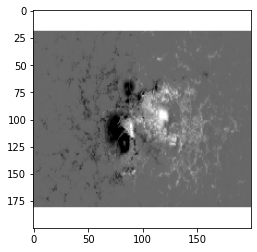

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-22 01 58 15.png


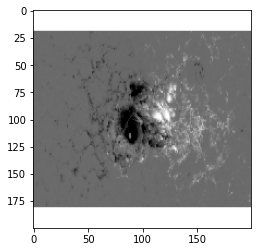

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-27 00 34 14.png


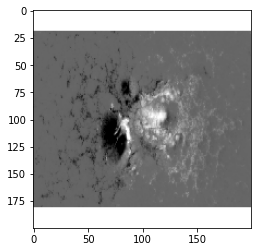

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-27 10 10 14.png


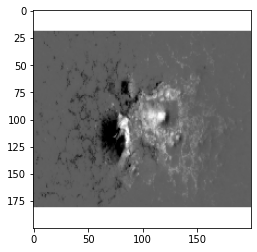

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-28 03 34 14.png


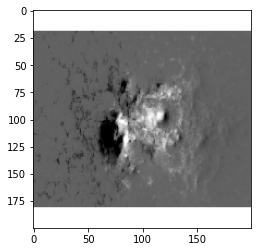

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-26 18 10 14.png


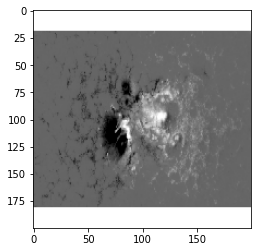

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-30 01 34 14.png


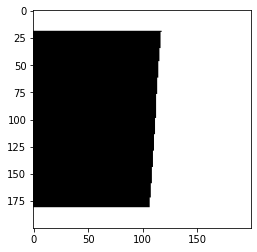

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-28 02 46 14.png


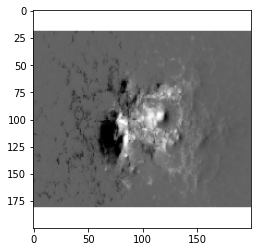

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-22 05 22 15.png


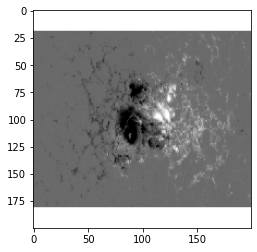

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-26 20 22 14.png


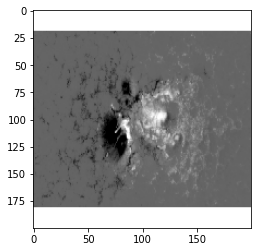

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-29 21 22 14.png


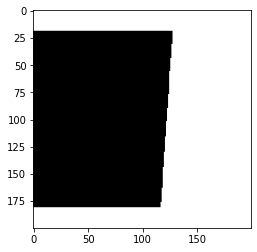

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-26 18 46 14.png


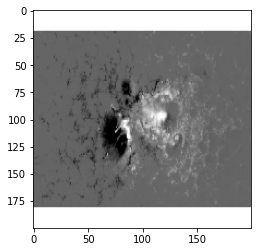

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-20 19 58 15.png


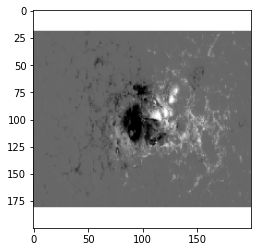

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-28 14 10 14.png


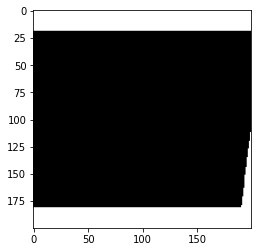

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-20 18 58 15.png


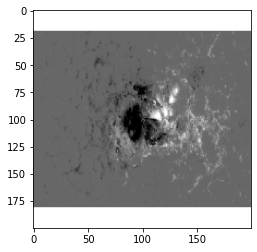

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-27 17 34 14.png


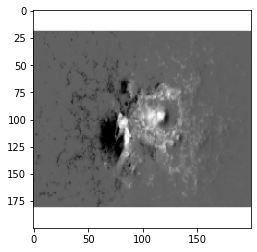

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-29 14 34 14.png


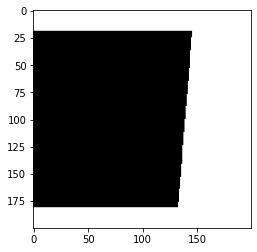

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-27 03 46 14.png


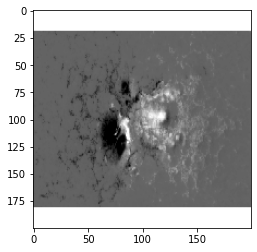

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-29 18 46 14.png


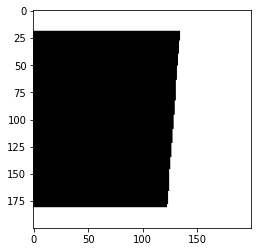

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-30 00 34 14.png


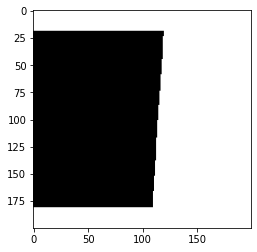

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-20 22 58 15.png


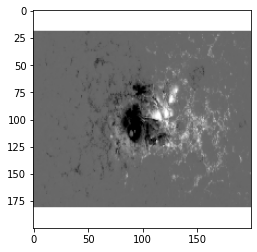

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-29 09 58 14.png


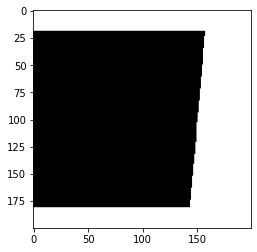

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-23 09 46 15.png


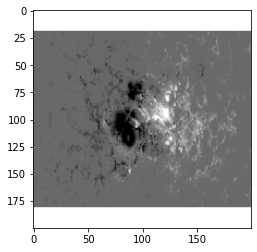

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-26 17 22 14.png


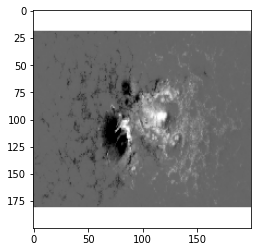

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-27 01 58 14.png


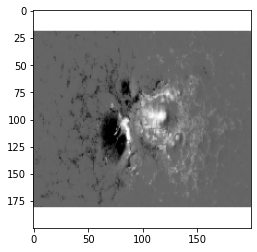

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-29 08 22 14.png


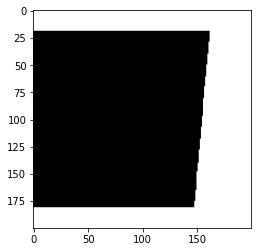

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-10-29 16 22 14.png


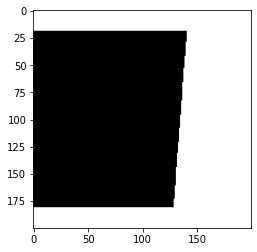

1/1 [==============================] - 0s 39ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-11-06 01 34 13.png


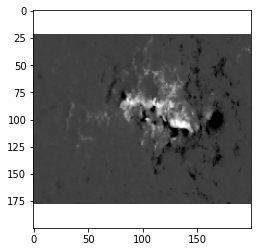

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-11-07 02 46 13.png


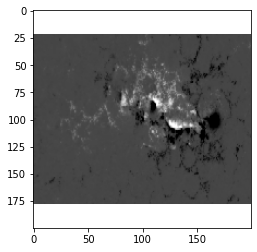

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-11-06 22 10 13.png


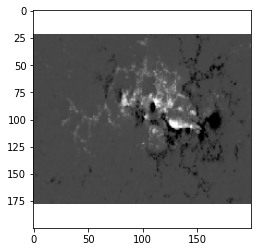

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-11-09 15 34 12.png


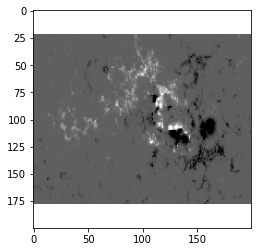

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-11-07 10 22 13.png


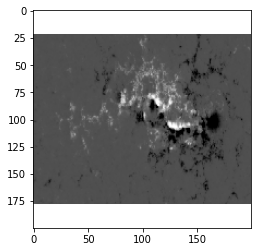

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-11-16 17 46 11.png


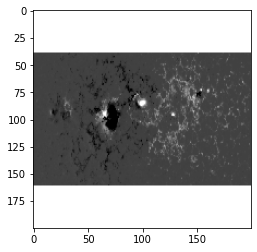

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-04 18 22 10.png


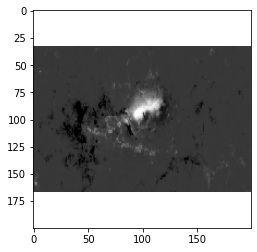

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-01 06 46 10.png


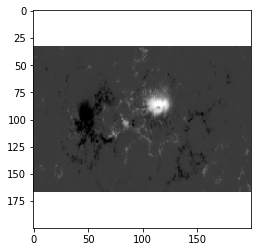

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-05 12 22 10.png


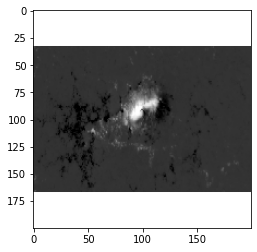

1/1 [==============================] - 0s 17ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-04 08 10 10.png


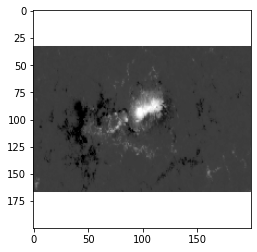

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-04 19 46 10.png


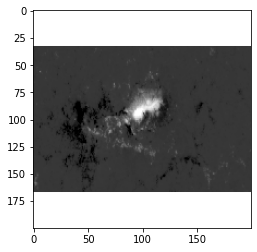

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-14 19 34 09.png


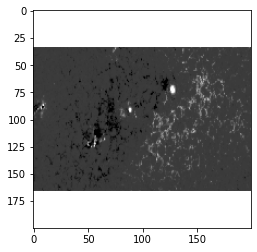

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-17 01 10 09.png


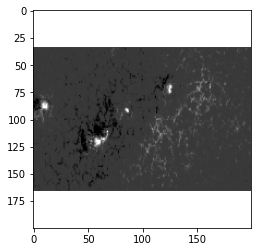

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-19 09 46 09.png


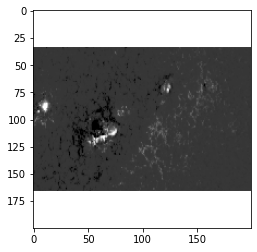

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-22 01 46 09.png


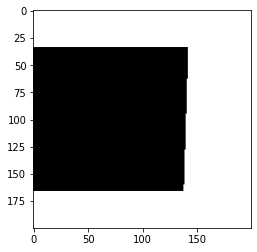

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-13 05 22 09.png


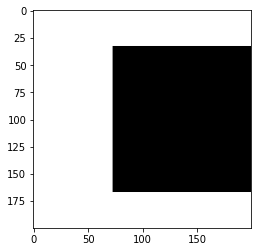

1/1 [==============================] - 0s 20ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-17 18 58 09.png


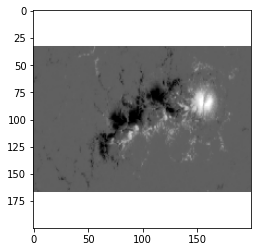

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-21 12 22 09.png


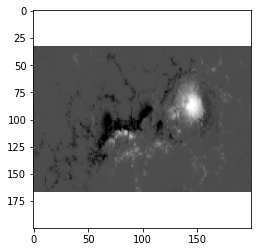

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2014-12-27 02 10 09.png


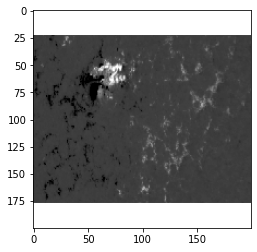

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-01-04 15 34 09.png


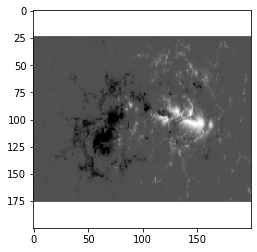

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-01-03 09 46 09.png


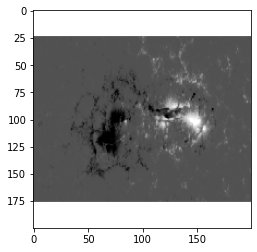

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-01-13 04 58 09.png


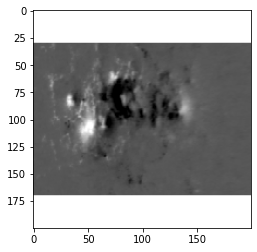

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-01-29 11 46 10.png


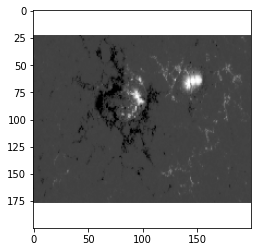

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-01-30 00 46 10.png


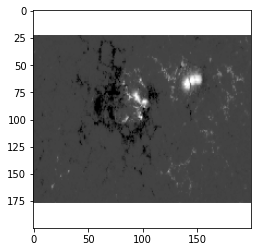

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-01-30 05 34 10.png


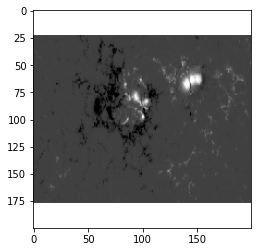

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-01-28 04 46 10.png


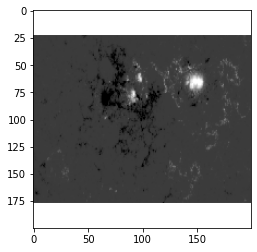

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-01-26 16 58 09.png


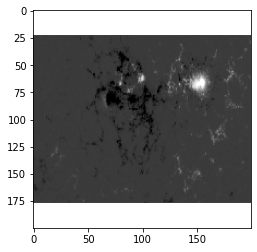

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-01-30 12 10 10.png


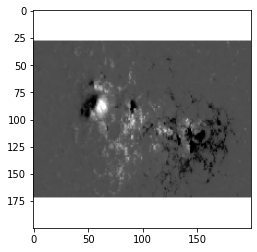

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-02-04 02 10 10.png


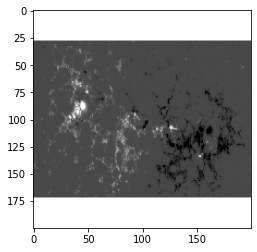

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-09 14 34 13.png


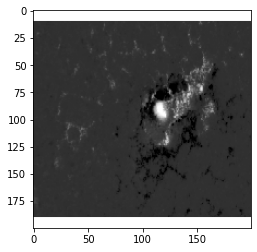

1/1 [==============================] - 0s 31ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-12 14 10 14.png


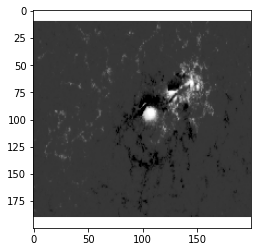

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-12 04 46 14.png


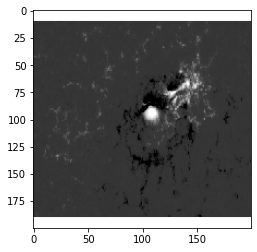

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-10 23 58 14.png


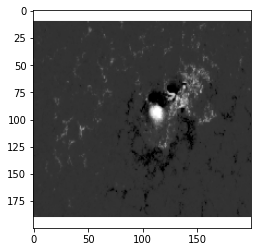

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-12 21 46 14.png


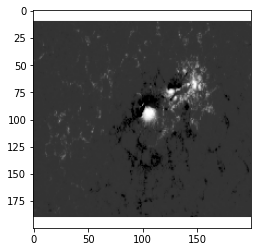

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-13 06 10 14.png


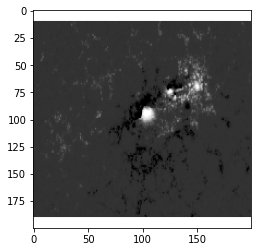

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-12 11 46 14.png


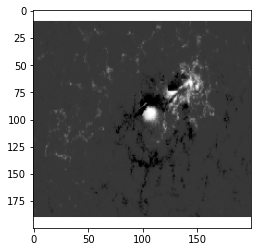

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-16 10 58 14.png


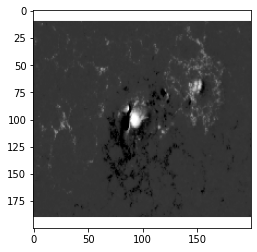

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-12 12 10 14.png


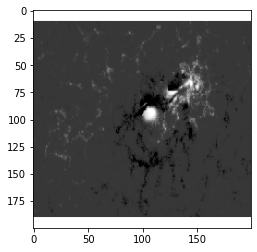

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-14 04 34 14.png


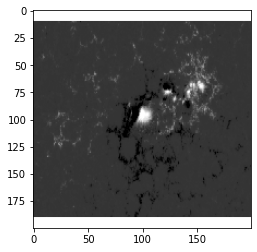

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-13 03 58 14.png


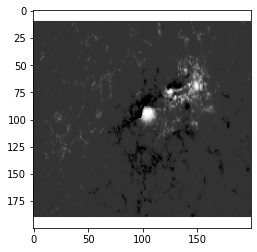

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-15 23 22 14.png


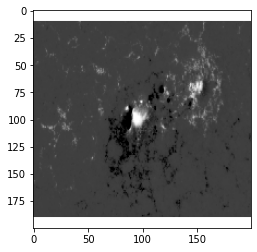

1/1 [==============================] - 0s 17ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-11 18 46 14.png


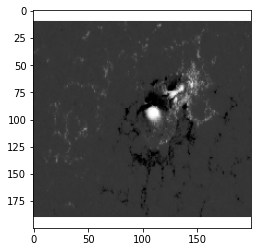

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-03-15 09 34 14.png


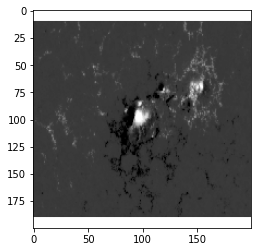

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-04-08 14 46 18.png


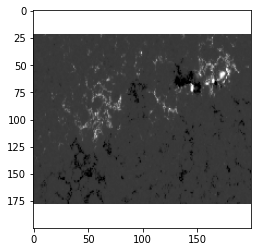

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-04-21 21 58 19.png


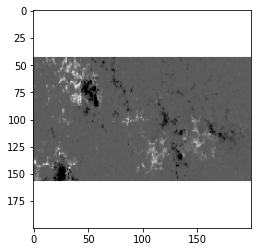

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-05-05 17 22 21.png


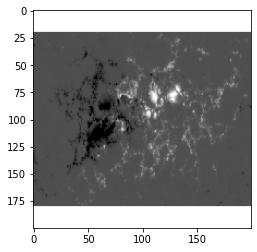

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-05-05 14 22 21.png


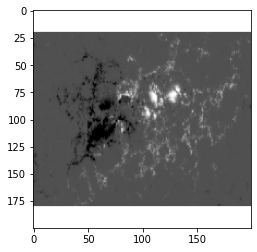

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-06-21 09 46 25.png


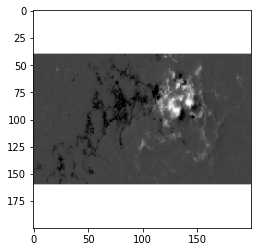

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-06-21 18 22 25.png


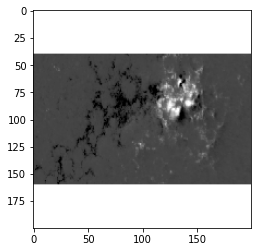

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-06-20 06 46 25.png


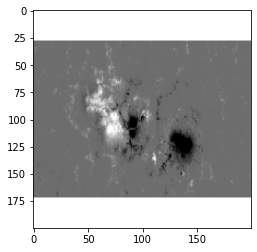

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-07-03 12 46 24.png


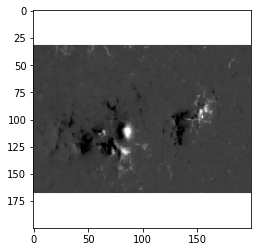

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-07-06 20 34 24.png


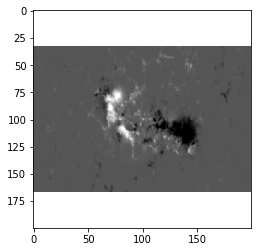

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-07-06 08 46 24.png


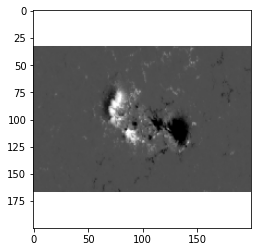

1/1 [==============================] - 0s 20ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-08-24 07 34 22.png


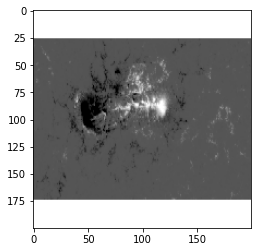

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-08-22 21 22 22.png


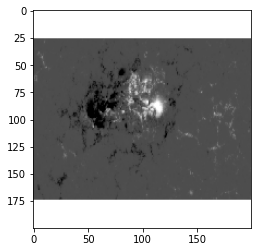

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-08-27 05 46 21.png


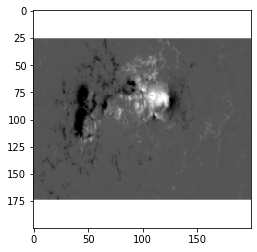

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-08-22 13 22 22.png


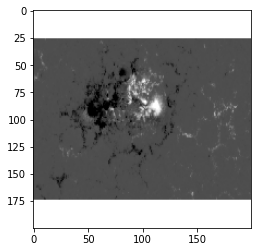

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-08-28 13 10 21.png


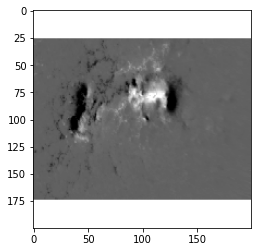

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-08-21 02 22 22.png


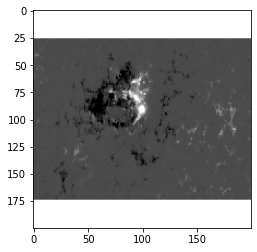

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-08-21 20 34 22.png


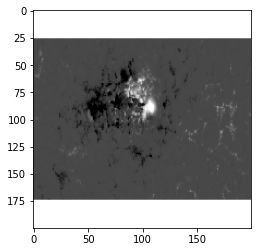

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-08-24 17 46 21.png


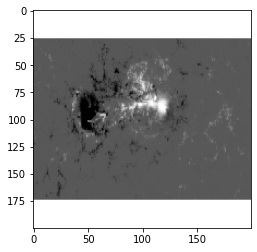

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-17 09 34 19.png


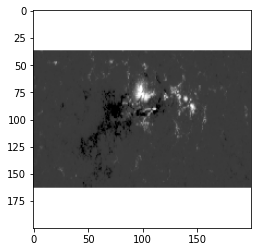

1/1 [==============================] - 0s 20ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-29 03 10 17.png


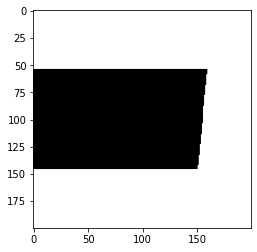

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-28 14 58 17.png


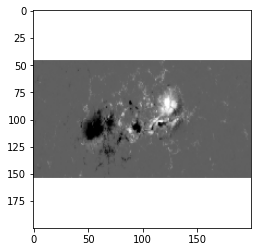

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-10-01 13 10 17.png


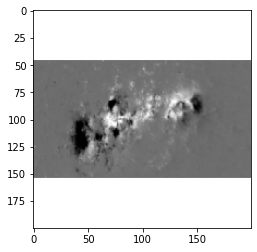

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-29 05 10 17.png


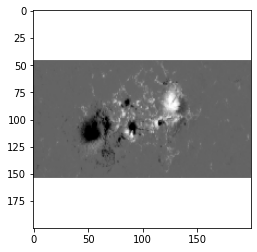

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-27 10 34 17.png


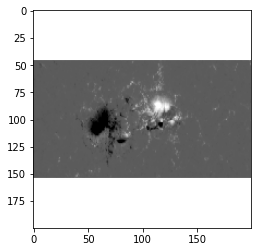

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-29 11 10 17.png


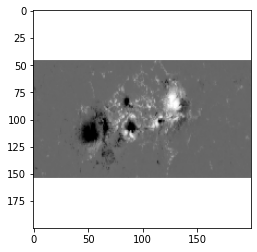

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-29 06 46 17.png


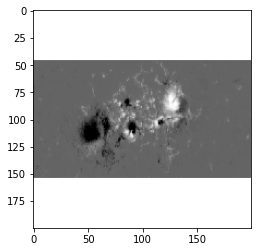

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-30 10 58 17.png


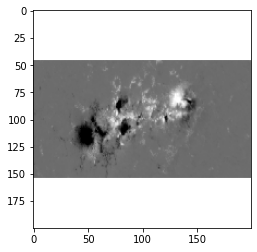

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-28 07 34 17.png


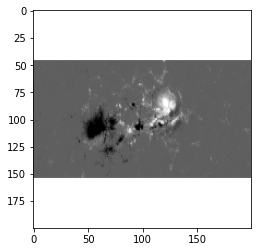

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-28 13 22 17.png


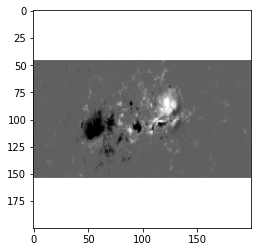

1/1 [==============================] - 0s 20ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-29 03 46 17.png


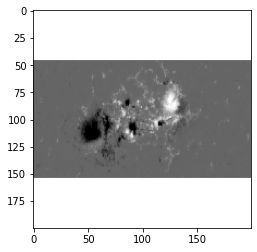

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-29 19 22 17.png


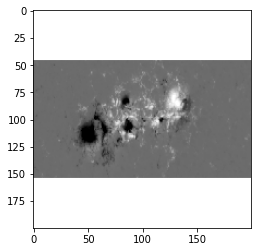

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-30 13 22 17.png


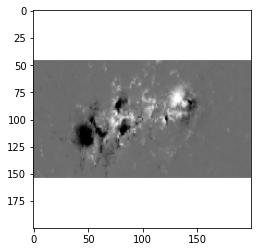

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-27 20 58 17.png


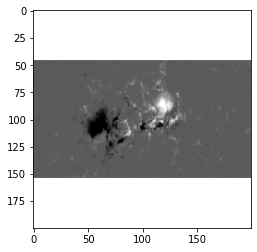

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-09-29 05 58 17.png


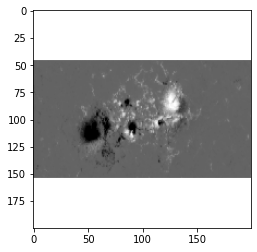

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-10-15 23 34 15.png


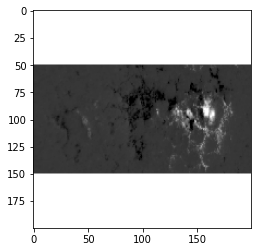

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-10-16 06 10 15.png


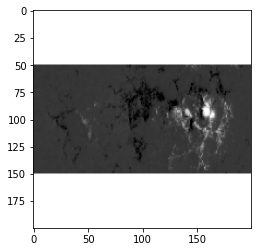

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-11-04 11 58 12.png


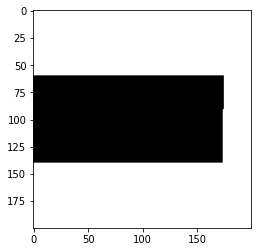

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-10-31 17 46 12.png


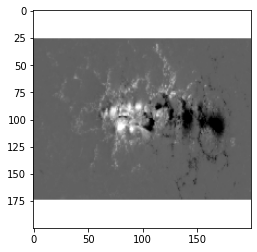

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-11-09 13 10 11.png


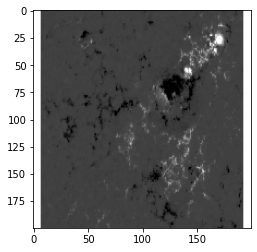

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2016-01-02 00 10 08.png


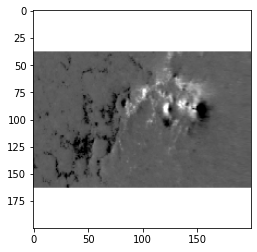

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-12-22 03 34 08.png


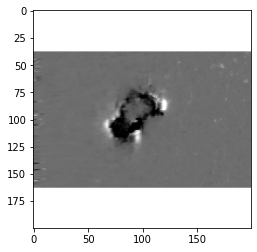

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2015-12-24 02 10 08.png


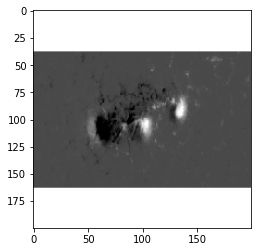

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2016-02-13 15 22 10.png


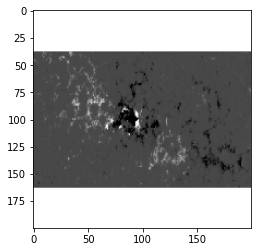

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2016-02-15 10 58 10.png


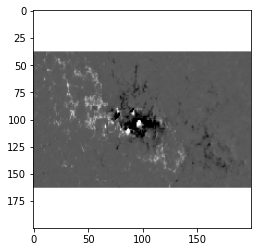

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2016-02-12 10 46 10.png


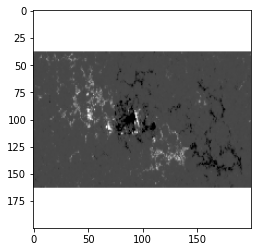

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2016-02-14 19 22 10.png


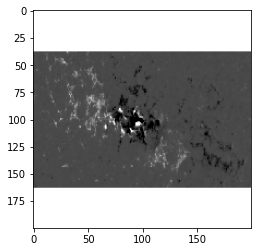

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2016-07-23 02 10 46.png


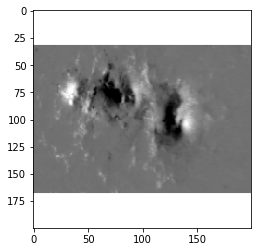

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2016-07-24 06 22 47.png


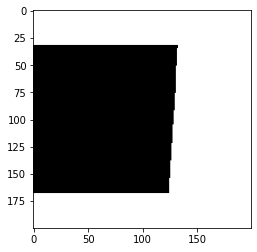

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2016-07-24 17 46 46.png


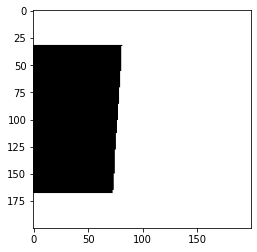

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2016-07-21 00 46 47.png


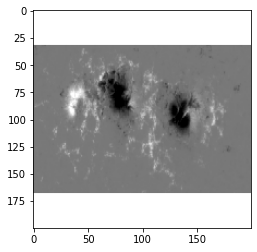

1/1 [==============================] - 0s 20ms/step

NOT a CME!
testing/no_cme//HMI hmi 2016-07-21 01 46 47.png


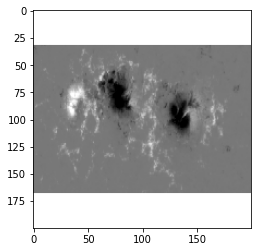

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2016-11-29 23 34 32.png


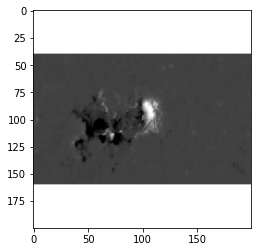

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2016-11-29 17 22 32.png


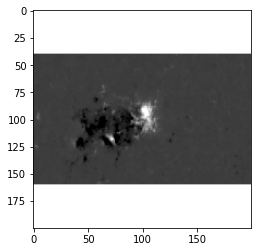

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-04-02 20 34 37.png


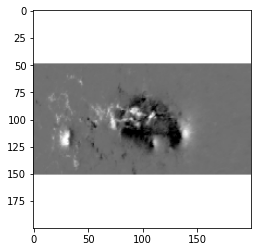

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-04-02 12 58 37.png


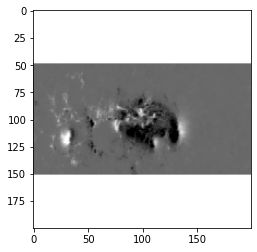

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-07-09 03 22 46.png


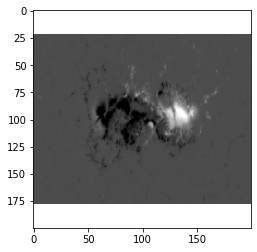

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-08-20 01 46 43.png


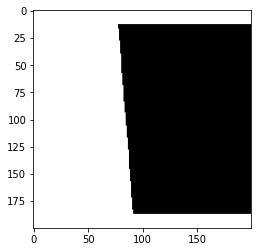

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-06 09 10 42.png


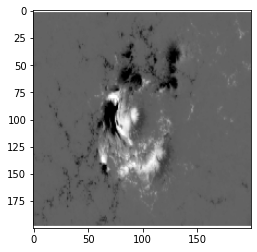

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-05 01 10 42.png


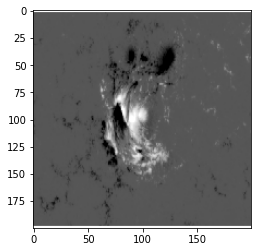

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-09 10 58 41.png


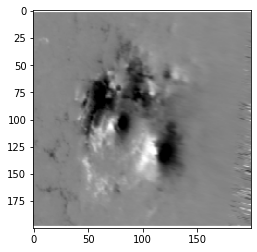

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-05 04 58 42.png


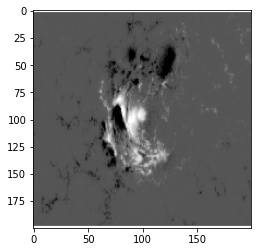

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-08 15 46 41.png


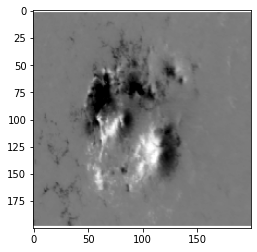

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-06 15 58 41.png


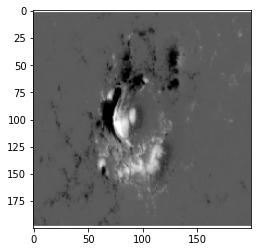

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-07 04 58 42.png


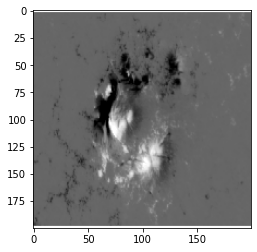

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-05 17 46 41.png


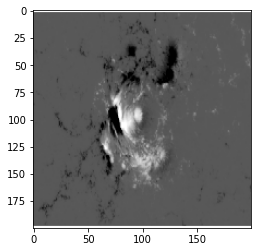

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-04 22 10 42.png


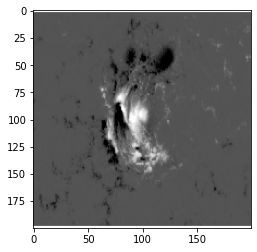

1/1 [==============================] - 0s 18ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-08 23 46 41.png


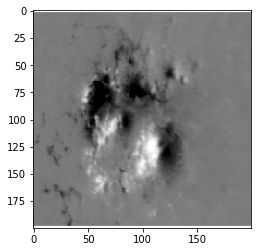

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-04 19 34 42.png


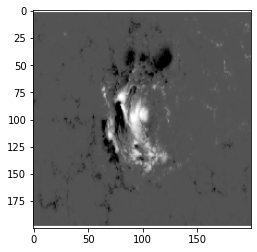

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-04 19 58 42.png


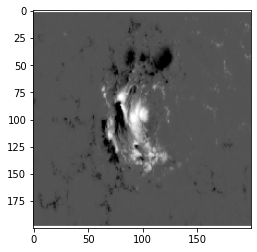

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-06 19 34 41.png


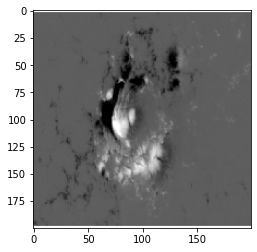

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-07 09 58 41.png


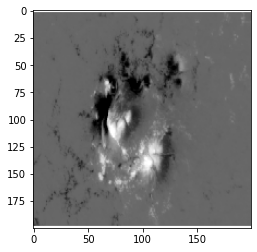

1/1 [==============================] - 0s 22ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-08 02 22 41.png


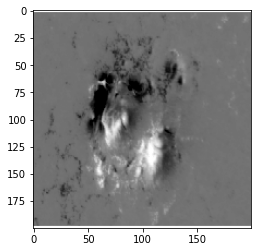

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-04 05 46 42.png


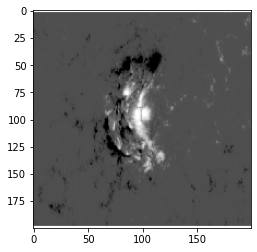

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-09 04 22 41.png


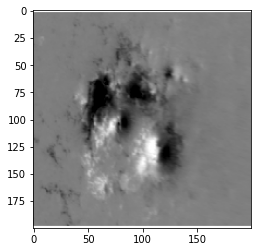

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-09 23 58 41.png


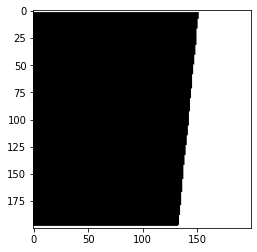

1/1 [==============================] - 0s 19ms/step

NOT a CME!
testing/no_cme//HMI hmi 2017-09-05 03 46 42.png


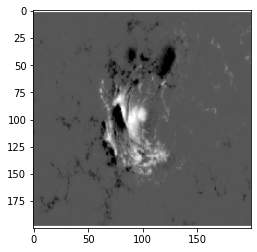

1/1 [==============================] - 0s 19ms/step

NOT a CME!


In [ ]:
dir_path = 'testing/no_cme'

for i in os.listdir(dir_path):
  print(dir_path + '//'+ i)
  img = image.load_img(dir_path + '//'+ i,target_size=(200,200))
  plt.imshow(img)
  plt.show()

  x = image.img_to_array(img)
  x = np.expand_dims(x,axis=0)
  images = np.vstack([x])
  val = model.predict(images)
  if val == 0:
    print('\nIts a CME!')
  else:
    print('\nNOT a CME!')